# Install and import relevant libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Read and load the data

In [12]:
def load_data(data):
  return pd.read_csv(data)

def variable_data(data):
  label = data.iloc[: , 0]
  value = data.iloc[: , 1:]
  column = list(data.columns.values.tolist())
  feature_name = [str(x) for x in column[1:]]
  return label, value, feature_name

## Dataset 1

Source: https://openmv.net/info/food-texture

Description: Texture measurements of a pastry-type food.

Data variables: 
- Oil: percentage oil in the pastry
- Density: the product’s density (the higher the number, the more dense the product)
- Crispy: a crispiness measurement, on a scale from 7 to 15, with 15 being more crispy.
- Fracture: the angle, in degrees, through which the pasty can be slowly bent before it fractures.
- Hardness: a sharp point is used to measure the amount of force required before breakage occurs.

Data shape:	50 rows and 5 columns

In [13]:
dataset1 = 'dataset/food-texture.csv'
dataset1 = pd.read_csv(dataset1, index_col='sample_name')
dataset1.head()

# Extract data variables
label1, data1, feature_name1= variable_data(dataset1) 

n_samples1, n_features1 = data1.shape
print('Number of samples:', n_samples1)
print('Number of features:', n_features1)

dataset1.describe().transpose()


Number of samples: 50
Number of features: 4


,count,mean,std,min,25%,50%,75%,max
oil,50.0,17.202,1.592007,13.7,16.30,16.9,18.10,21.2
density,50.0,2857.600,124.499980,2570.0,2772.50,2867.5,2945.00,3125.0
crispy,50.0,11.520,1.775571,7.0,10.00,12.0,13.00,15.0
fracture,50.0,20.860,5.466073,9.0,17.00,21.0,25.00,33.0
hardness,50.0,128.180,31.127578,63.0,107.25,126.0,143.75,192.0


## Dataset 2

Source: Dharmawan et al 2025

Description: Shape descriptions of three coffee beans: longberry, premium, peaberry

Data variables: [area, perimeter, major_axis_length, minor_axis_length, bounding_box_area, convex_area, compactness, roundness, complexity, equiv_dimater, aspect_ratio, elongation, extent, convexity, solidity, SF1, SF2, SF3, SF4]

In [14]:
dataset2 = 'dataset/coffee-grading.csv'
dataset2 = load_data(dataset2)
dataset2.head(5)

# Extract data variables
label2, data2, feature_name2  = variable_data(dataset2)

label_name2 = ['longberry', 'normal', 'peaberry']

n_samples2, n_features2 = data2.shape
print('Number of samples:', n_samples2)
print('Number of features:', n_features2)

dataset2.describe().transpose()

Number of samples: 1010
Number of features: 19


,count,mean,std,min,25%,50%,75%,max
class,1010.0,1.092079,0.762369,0.00000,1.000000,1.000000,2.000000,2.00000
area,1010.0,6800.110891,1241.210485,3827.50000,5845.250000,6806.500000,7698.500000,10744.00000
perimeter,1010.0,318.689769,30.694929,239.23759,296.400542,318.714245,340.032270,399.70562
major_axis_length,1010.0,112.669491,13.095990,81.52654,102.862070,111.106315,120.909595,152.25914
minor_axis_length,1010.0,77.038392,8.078990,56.93955,71.003887,77.381955,82.606522,103.04279
bounding_box_area,1010.0,8735.686139,1601.391882,4941.00000,7546.500000,8700.500000,9879.750000,13736.00000
convex_area,1010.0,6903.357921,1257.607763,3887.50000,5959.000000,6904.500000,7813.250000,10869.50000
compactness,1010.0,0.835428,0.029218,0.69939,0.819250,0.840240,0.857665,0.88967
roundness,1010.0,0.916652,0.028362,0.80403,0.900325,0.921125,0.938335,0.96928
complexity,1010.0,15.060900,0.546444,14.12470,14.651843,14.955660,15.338877,17.96763


# Visualizing multivariate data

https://developer.ibm.com/tutorials/awb-implementing-linear-discriminant-analysis-python/

## Pair plots

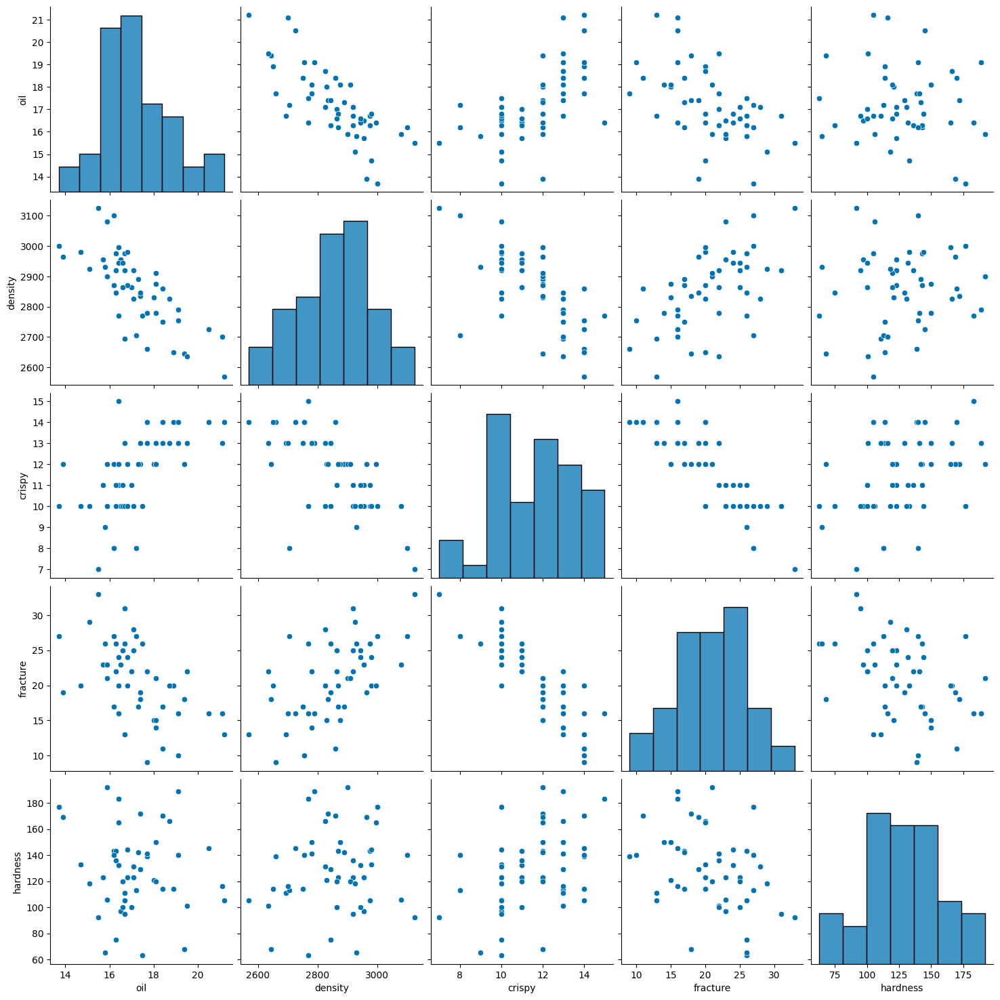

In [61]:
# Visualize the data using scatter plot and histogram
sns.set_palette('colorblind')
sns.pairplot(data=dataset1, height=3)

The pair plot effectively illustrates how the features vary and correlate across the three classes of coffee samples. In addition, it provides insights into the separability and overlap of these classes within the feature space, facilitating a deeper understanding of the characteristics and differences among the classes. The diagonal plot elements showcase the distribution of each feature, while the off-diagonal plot elements display scatterplots for each pair of features.

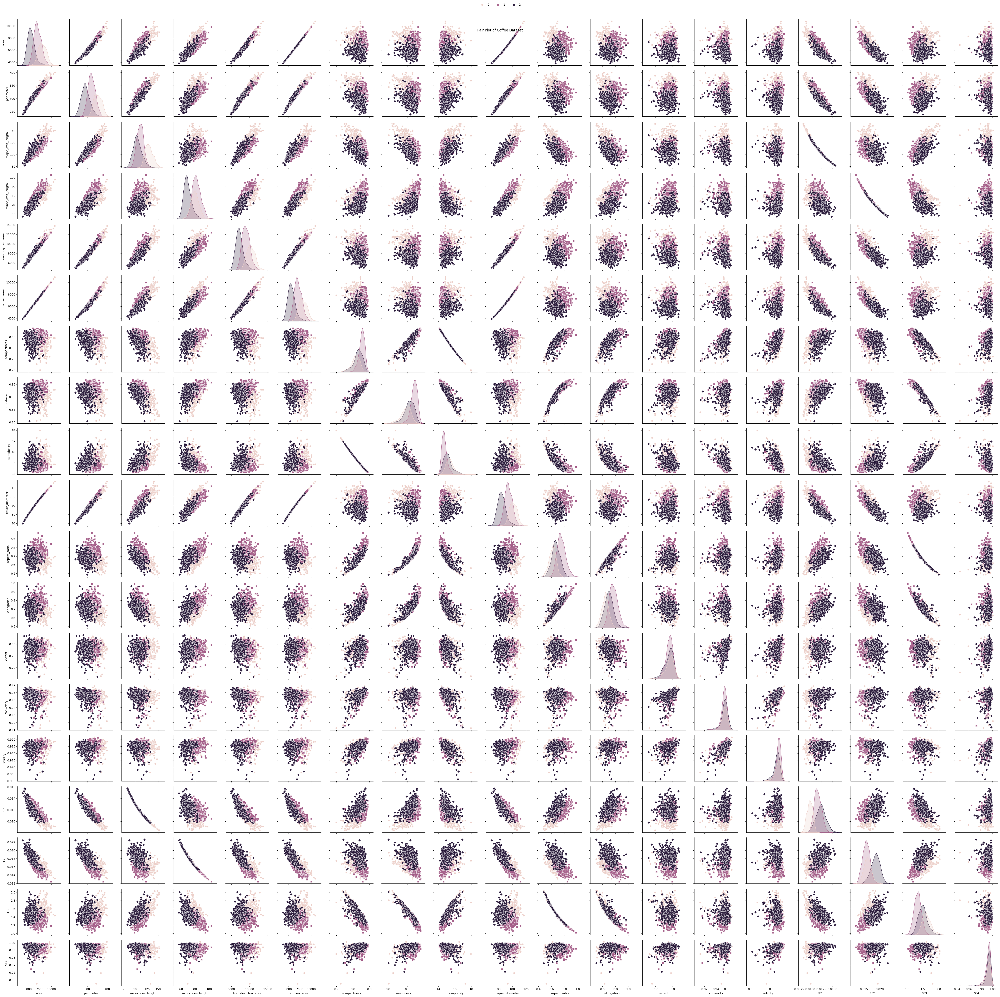

In [13]:
"""For Classification"""
ax = sns.pairplot(dataset2, hue='class', markers=["o", "s", "D"])
plt.suptitle("Pair Plot of Coffee Dataset")
sns.move_legend(ax, "lower center", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)
plt.tight_layout()
plt.show()

## Histograms

Histograms are valuable tools for visualizing the distribution of individual features within the coffee dataset.

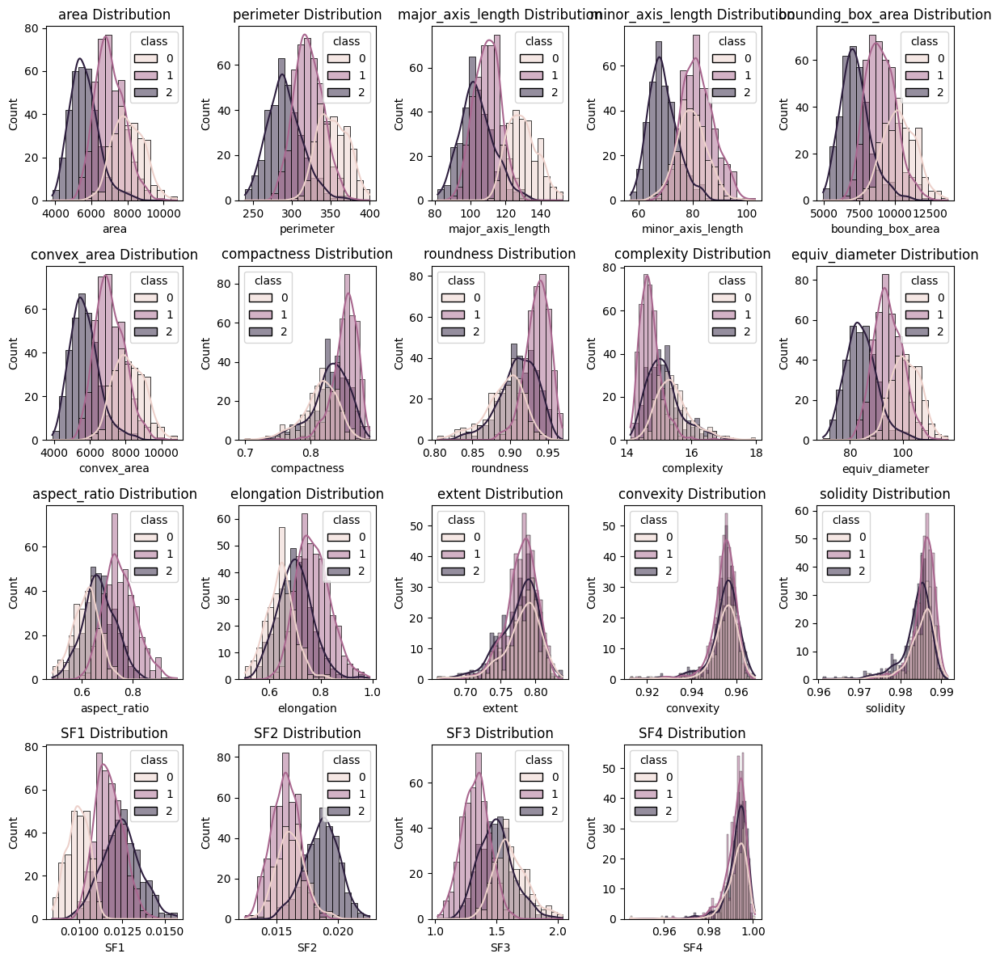

In [25]:
# Visualize the distribution of each feature using histograms.
plt.figure(figsize=(12, 12))
for i, feature in enumerate(feature_name2):
    plt.subplot(4, 5, i+1)
    sns.histplot(data=dataset2, x=feature, hue='class', kde=True)
    plt.title(f'{feature} Distribution')
plt.tight_layout()
plt.show()

## Correlation heatmaps

A correlation heatmap offers insights into the relationships between different features in the coffee data set. It plays a critical role in feature selection as it helps identify positive and negative correlations between two variables.

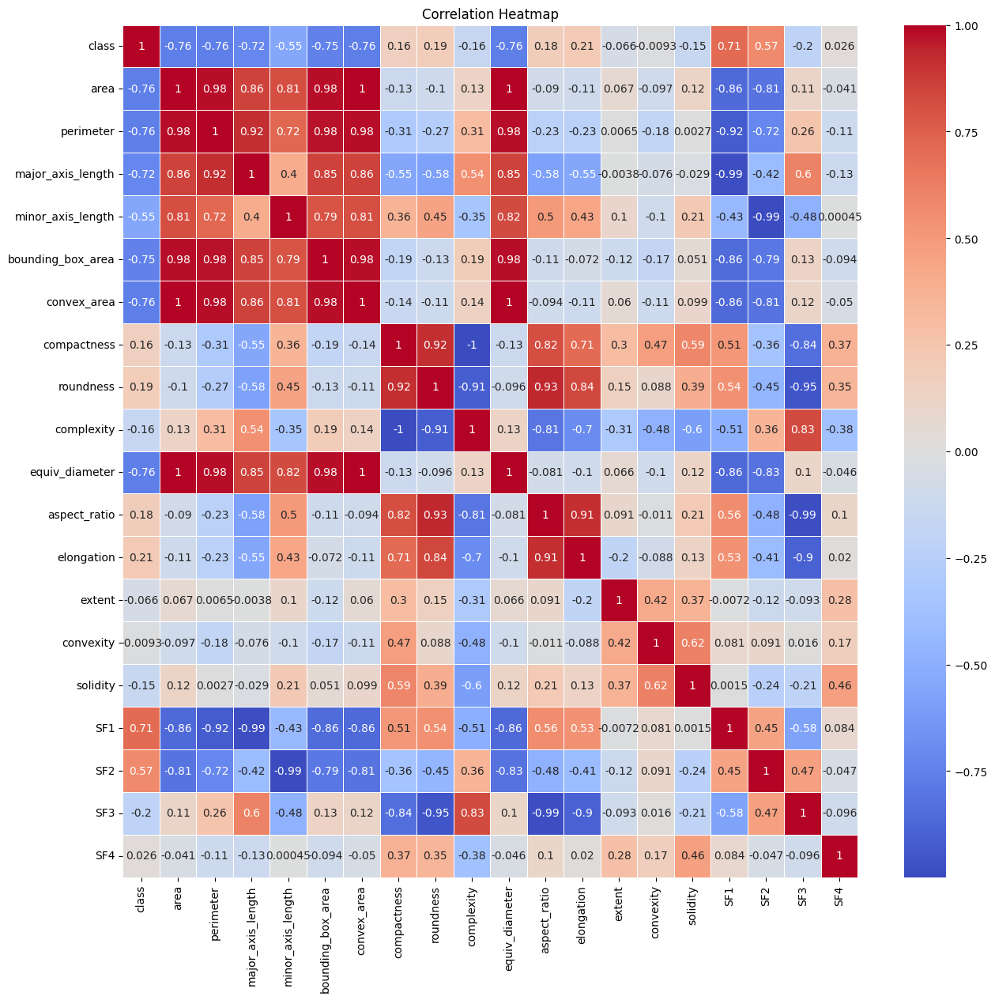

In [48]:
correlation_matrix = dataset2.corr(numeric_only= True)
plt.figure(figsize=(15, 14))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

# PCA from scratch

In [16]:
from sklearn.preprocessing import StandardScaler
"""STEP 1 - Data Scaling"""
x_scaled = StandardScaler().fit_transform(data2)

def pca(x_scaled):
    
    """STEP 2 - Find the covariance matrix"""
    mean_vector = np.mean(x_scaled, axis=0)
    covmat = (x_scaled - mean_vector).T.dot((x_scaled - mean_vector))/(x_scaled.shape[0]-1)
    # cara lain
    covmat_ = np.cov(x_scaled.T)

    """STEP 3 - Eigen Decomposition"""
    # Eigen from covariance matrix
    eigenvalues, eigenvectors = np.linalg.eig(covmat_)
    # Eigen from correlatioin matrix
    cormat = np.corrcoef(x_scaled.T)
    eigenvalues_, eigenvectors_ = np.linalg.eig(cormat)

    """STEP 4 - Sort the eigvals and eigvecs"""
    # Make a list of (eigenvalue, eigenvector) tuples
    eigen_pairs = [(np.abs(eigenvalues[i]), eigenvectors[:,i]) for i in range(len(eigenvalues))]

    # Sort the (eigenvalue, eigenvector) tuples from high to low
    eigen_pairs.sort(key=lambda x_scaled: x_scaled[0], reverse=True)

    """STEP 5 - Choose the Principle Components by selecting top K eigenvectors"""
    # Visually confirm that the list is correctly sorted by decreasing eigenvalues
    for a in eigen_pairs:
        if(a[0]>0.1):
            print('Sorted Eignevalues: {}'.format(a[0]))

    # For further usage
    eig_vals_sorted = np.array([x_scaled[0] for x_scaled in eigen_pairs])
    eig_vecs_sorted = np.array([x_scaled[1] for x_scaled in eigen_pairs])

    eigval_total = sum(eigenvalues)
    explained_variance = [(i/eigval_total) for i in sorted(eigenvalues, reverse=True)]
    explained_variance = np.round(explained_variance, 3)

    for b in explained_variance:
        if (b>(0.1/100)):
            print('Explained Variance: {}%'.format(round(b*100, 2)))
    
    cum_explained_variance = np.cumsum(explained_variance)
    cum_explained_variance = np.round(cum_explained_variance, 3)

    for c in cum_explained_variance:
        if (c<0.99):
            print('Cumulative Explained Variance: {}%'.format(round(c*100, 2)))

    #print('Explained variance: {}%'.format(explained_variance*100))
    #print('Cumulative explained variance: {}'.format(cum_explained_variance*100))

    return eigenvalues, eig_vecs_sorted, explained_variance, cum_explained_variance

In [17]:
eigval, eigvecs_sorted, expl_var, cum_expl_var = pca(x_scaled)

Sorted Eignevalues: 8.236098005696903
Sorted Eignevalues: 6.343826541289896
Sorted Eignevalues: 2.390859027366326
Sorted Eignevalues: 0.868207812862881
Sorted Eignevalues: 0.7508400483277305
Sorted Eignevalues: 0.26257867791050093
Explained Variance: 43.3%
Explained Variance: 33.4%
Explained Variance: 12.6%
Explained Variance: 4.6%
Explained Variance: 3.9%
Explained Variance: 1.4%
Explained Variance: 0.5%
Explained Variance: 0.2%
Cumulative Explained Variance: 43.3%
Cumulative Explained Variance: 76.7%
Cumulative Explained Variance: 89.3%
Cumulative Explained Variance: 93.9%
Cumulative Explained Variance: 97.8%


In [19]:
"""STEP 6 - Data Projection/Transformation"""
k = 6
W = eigvecs_sorted[:k, :]

X_proj = x_scaled.dot(W.T)
print(X_proj.shape)

pc_list = ['FA'+ str(i) for i in list(range(1, k+1))]

"""PCA Loading or correlation coefficients"""
loadings = pd.DataFrame.from_dict(dict(zip(pc_list, W)))
print(loadings.head())

"""PCA Scores"""
score = pd.DataFrame.from_dict(dict(zip(pc_list, X_proj)))
df_score = pd.DataFrame(X_proj, columns= pc_list, index=label2) # change label
df_score = df_score[df_score.columns[0:k]]

print(df_score.head(5))

(1010, 6)
        PC1       PC2       PC3       PC4       PC5       PC6
0 -0.312903  0.173318  0.017881 -0.002991  0.008128  0.037524
1 -0.334810  0.109555 -0.016188  0.005257  0.025257 -0.006622
2 -0.342971 -0.028679  0.095649 -0.015632 -0.052189  0.032230
3 -0.175099  0.335435 -0.100903 -0.044878  0.074921 -0.004807
4 -0.315084  0.156466 -0.058774  0.015322 -0.143926  0.055137
            PC1       PC2       PC3       PC4       PC5       PC6
class                                                            
0     -2.041921  0.444616  2.920939 -0.169262  0.479492  0.405978
0     -3.297497 -0.273896  0.558781  0.068726 -0.452801  0.140171
0     -4.572045 -3.794420 -4.580184  3.352624  2.734382 -0.846768
0     -2.385798 -0.134908 -0.685375 -0.457831 -0.909815 -0.042452
0     -4.120147 -2.671711 -5.184366  1.479384  2.075393 -0.391059


In [119]:
def scree_plot(cum_expl_var, n_features):
    # change number of features -->
    fig, ax = plt.subplots(figsize=(6,4))
    plt.plot(np.arange(1, n_features+1), cum_expl_var, '-o')
    plt.xticks(np.arange(1, n_features+1))
    plt.xlabel('Number of components')
    plt.ylabel('Cumulative explained variance')
    plt.title('Scree Plot')
    plt.show()

def plot_pca(x_pca, expl_var, target, label_name):
    PC1 = x_pca[:,0]
    PC2 = x_pca[:,1]
    scalePC1 = 1.0/(PC1.max() - PC1.min())
    scalePC2 = 1.0/(PC2.max() - PC2.min())

    #"""PCA Score Plot"""
    #unique = list(set(label))
    #colors = [plt.cm.jet(float(i)/max(unique)) for i in unique]
    #with plt.style.context(('ggplot')):
    #    fig, ax = plt.subplots(figsize=(6,6))
    #    for i, u in enumerate(unique):
    #        col = np.expand_dims(np.array(colors[i]), axis=0)
    #        ld1 = [x_pca[j,0] for j in range(len(x_pca[:,0])) if label[j] == u]
    #        ld2 = [x_pca[j,1] for j in range(len(x_pca[:,1])) if label[j] == u]
    #        plt.scatter(ld1, ld2, # ------------------------------------------------ < CHANGE INPUT
    #                    c=col, s=20, edgecolors='k', label=str(u))
    
    ax = plt.subplot(111)
    for label, marker, color in zip(range(0,3), ("^", "s", "o"), ('blue', 'red', 'green')):
        plt.scatter(PC1.real[target==label], PC2.real[target==label], 
                    marker=marker, color=color, alpha=0.8, label = feature_name2)
    
    plt.legend(label_name, loc = 'lower right')
    plt.title('PCA score plot')
    ax.axhline(y=0.0, color='black', linestyle='dashed', alpha = 1.0) # label = 'Horizontal Line ')
    ax.axvline(x=0.0, color='black', linestyle='dashed', alpha = 1.0) # label = 'Vertical Line ')     # , - -- : None , solid, dashed, dashdot, dotted
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.xaxis.grid(color='gray', linestyle='dashed')
    yabs_max = abs(max(ax.get_ylim(), key=abs))
    ax.set_ylim(ymin=-yabs_max, ymax=yabs_max)
    xabs_max = abs(max(ax.get_xlim(), key=abs))
    ax.set_xlim(xmin=-xabs_max, xmax=xabs_max)
    ax.xaxis.label.set_color('black')
    ax.yaxis.label.set_color('black')
    ax.set_xlabel('PC1 {}%'.format(expl_var[0]*100), size=12).set_color('black')
    ax.set_ylabel('PC2 {}%'.format(expl_var[1]*100), size=12).set_color('black')
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='y', colors='black')
    ax.spines['left'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.set_facecolor("white")
    plt.show()

def biplot(W, feature_name):
    fig, ax = plt.subplots(figsize=(6,5))
    for i, feature in enumerate(feature_name):
        ax.arrow(0, 0, W[0,i], W[1,i], head_width = 0.02, head_length = 0.02, color = 'black')
        ax.text(W[0,i]*1.15, W[1,i]*1.15, feature, color = 'black', fontsize=10).set_bbox(dict(facecolor='white', alpha=0.5, edgecolor='gray'))
    ax.set_xlabel('PC1', fontsize=12)
    ax.set_ylabel('PC2', fontsize=12)
    ax.set_title('2D PCA Biplot')
    ax.axhline(y=0.0, color='black', linestyle='dashed', alpha = 1.0) # label = 'Horizontal Line ')
    ax.axvline(x=0.0, color='black', linestyle='dashed', alpha = 1.0) # label = 'Vertical Line ')
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.xaxis.grid(color='gray', linestyle='dashed')
    yabs_max = abs(max(ax.get_ylim(), key=abs))
    ax.set_ylim(ymin=-(yabs_max+(yabs_max/3)), ymax=(yabs_max+(yabs_max/3)))
    xabs_max = abs(max(ax.get_xlim(), key=abs))
    ax.set_xlim(xmin=-(xabs_max+(xabs_max/3)), xmax=(xabs_max+(xabs_max/3)))
    ax.xaxis.label.set_color('black')
    ax.yaxis.label.set_color('black')
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='y', colors='black')
    ax.spines['left'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.set_facecolor("white")
    plt.show()

def pca_coeff(W, feature_name):
    plt.matshow(W[0:2,:], cmap='viridis')
    plt.yticks([0,1], ["First", "Second"], size=14)
    plt.colorbar()
    plt.xticks(range(len(feature_name)),
               feature_name, rotation=60, ha='left', size=12)
    plt.xlabel("Features", size=14)
    plt.ylabel("PCs", size=14)
    plt.show()


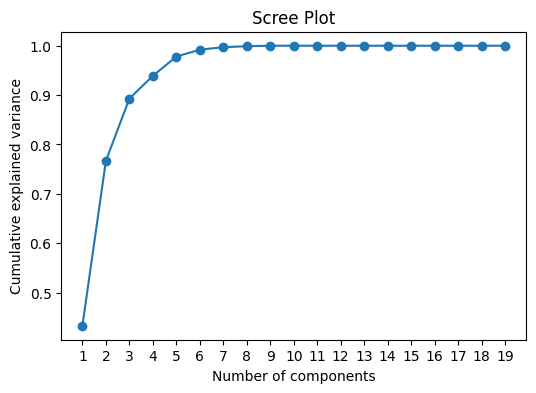

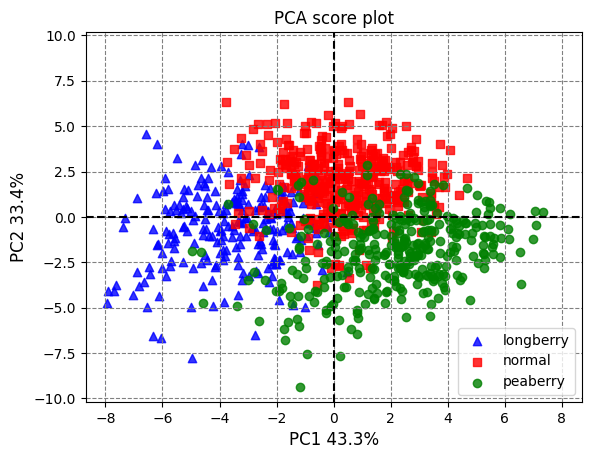

TypeError: biplot() takes 2 positional arguments but 4 were given

In [120]:
scree_plot(cum_expl_var, n_features2)
plot_pca(X_proj, expl_var, label2, label_name2)
biplot(W, expl_var, feature_name2, label_name2)
pca_coeff(W, feature_name2)

In [72]:
def pca_plot(x_proj, W, explained_variance, n_samples, target, feature_name, label_name):
    PC1 = x_proj[:,0]
    PC2 = x_proj[:,1]
    scalePC1 = 1.0/(PC1.max() - PC1.min())
    scalePC2 = 1.0/(PC2.max() - PC2.min())

    colors = np.random.rand(n_samples)
    fig, ax = plt.subplots(figsize=(7,6))
    ax.scatter(PC1*scalePC1, PC2*scalePC2, c = colors, s=20, label=target)
    plt.colorbar()

    for i, feature in enumerate(feature_name):
        ax.arrow(0, 0, W[0,i], W[1,i], head_width = 0.02, head_length = 0.02, color = 'black')
        ax.text(W[0,i]*1.15, W[1,i]*1.15, feature, color = 'black', fontsize=10).set_bbox(dict(facecolor='gray', alpha=0.5, edgecolor='gray'))
    
    for i, txt in enumerate(target):
        ax.annotate(txt, (PC1[i], PC2[i]), xytext=(5, -5), textcoords='offset points') 

    ax.set_xlabel('PC1 ('+str(round(explained_variance[0]*100,2))+'%)', fontsize=12)
    ax.set_ylabel('PC2 ('+str(round(explained_variance[1]*100,2))+'%)', fontsize=12)
    ax.set_title('2D PCA Biplot')
    ax.axhline(y=0.0, color='black', linestyle='dashed', alpha = 1.0) # label = 'Horizontal Line ')
    ax.axvline(x=0.0, color='black', linestyle='dashed', alpha = 1.0) # label = 'Vertical Line ')
    ax.yaxis.grid(color='gray', linestyle='dashed')
    ax.xaxis.grid(color='gray', linestyle='dashed')
    yabs_max = abs(max(ax.get_ylim(), key=abs))
    ax.set_ylim(ymin=-(yabs_max), ymax=yabs_max)
    xabs_max = abs(max(ax.get_xlim(), key=abs))
    ax.set_xlim(xmin=-(xabs_max), xmax=xabs_max)
    ax.xaxis.label.set_color('black')
    ax.yaxis.label.set_color('black')
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='y', colors='black')
    ax.spines['left'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.set_facecolor("white")
    plt.legend(label_name, loc = 'lower left')
    plt.show()

# Refcode

In [ ]:
# https://learnche.org/pid/latent-variable-modelling/principal-component-analysis/index